In [1]:
import os
import sys
import warnings
from pathlib import Path

import datetime

import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText
import math

import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display

from keras.models import Model
from keras.layers import Input, Conv1D, Dense, Activation, Dropout, Lambda, Multiply, Add, Concatenate
#from keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

from traffic_stock import func_smape, quantile_filter


2023-11-28 19:00:36.360246: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-28 19:00:36.463755: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-11-28 19:00:36.463775: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-11-28 19:00:36.881887: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-

In [2]:
''' Plot settings'''

plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'

In [3]:
# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
mem = {
    key: value/1e6
    for key, value in sorted(
        [
            (x, sys.getsizeof(globals().get(x)))
            for x in dir()
            if not x.startswith("_") and x not in sys.modules and x not in ipython_vars
        ],
        key=lambda x: x[1],
        reverse=True,
    )
}

------------------------------

# Data loading 

In [3]:
#df_train_1 = pd.read_csv('../train_1.csv')
df_train = pd.read_csv('data/train_2.csv')
df_train.set_index('Page', inplace=True)
df_train.columns = [x.date() for x in pd.to_datetime(df_train.columns)]

In [4]:
# Choose 10 pages for analysis
df_sorted = df_train.sum(axis=1).sort_values(ascending=False)
indx_10_pages = [df_sorted.index[0]] + [df_sorted.index[df_sorted.size//(i*10)] for i in range(1,10)]
indx_10_pages

['Main_Page_en.wikipedia.org_all-access_all-agents',
 '大塚芳忠_ja.wikipedia.org_all-access_all-agents',
 "The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents",
 'Temperatura_es.wikipedia.org_all-access_all-agents',
 'Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents',
 'Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents',
 'Coca-Cola_en.wikipedia.org_all-access_all-agents',
 'Josh_Brolin_en.wikipedia.org_all-access_all-agents',
 'Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents',
 'Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents']

In [5]:
n_test_days = 61

# WaveNet architecture

The model architecture was adopted from this solution available on kaggle: https://rb.gy/j6k1wa 
The proccess of data splitting and preprocessing has been changed.\
The current notebook is mainly devoted to studying the impact of this process on the final result 
and adapting this approach to create a forecast based on the data from only 10 time series.

In [6]:
'''
Here I leave 61 days for the final test (df_valid_y) and use the rest of dataset for training and validation. 
For training, I use the entire time series except the last 61 days, which are used as labels.
The test (validation) data is organized in the same way: it starts 61 days from the start of the dataset and ends on the last available day. 
'''

class TrainSplitter:
    def __init__(self, df, n_predict, log=True, norm=True):
        self.df = df
        self.n_predict = n_predict
        
        self.df_train_X = df.iloc[:,:-2*n_predict]
        self.df_train_y = df.iloc[:,-2*n_predict : -n_predict]
        
        self.df_valid_X = df.iloc[:,n_predict:-n_predict]
        self.df_valid_y = df.iloc[:,-n_predict:]
        
        self.is_log = log
        self.is_norm = norm
        
        if log:
            self.train_X = np.log1p(self.df_train_X)
            self.train_y = np.log1p(self.df_train_y)
            
            self.valid_X = np.log1p(self.df_valid_X)
            self.valid_y = np.log1p(self.df_valid_y)
        else:
            self.train_X = self.df_train_X
            self.train_y = self.df_train_y
            
            self.valid_X = self.df_valid_X
            self.valid_y = self.df_valid_y        
            
        self.train_mean = self.train_X.mean(axis=1)
        self.train_std = self.train_X.std(axis=1)       
        
        self.valid_mean = self.valid_X.mean(axis=1)
        self.valid_std = self.valid_X.std(axis=1)
        
        if norm:            
            self.train_X = self.norm(self.train_X).fillna(0)
            self.train_y = ((self.train_y.T - self.train_mean)/self.train_std).T.fillna(0)
            #self.train_y = (self.train_y.T - self.train_mean).T.fillna(0)
            #self.df_train_pred = self.df_train_pred.subtract(self.train_mean, axis='index').div(self.train_std, axis='index', fill_value=0)
            
            self.valid_X = self.norm(self.valid_X).fillna(0)
            self.valid_y = ((self.valid_y.T - self.valid_mean)/self.valid_std).T.fillna(0)
            #self.valid_y = (self.valid_y.T - self.valid_mean).T.fillna(0)
        else:
            self.train_X.fillna(0, inplace=True)
            self.train_y.fillna(0, inplace=True)
            
            self.valid_X.fillna(0, inplace=True)
            self.valid_y.fillna(0, inplace=True)            
            
    def to_numpy(self):
        self.train_X = np.expand_dims(self.train_X.values, axis=2)
        self.train_y = np.expand_dims(self.train_y.values, axis=2)
        self.valid_X = np.expand_dims(self.valid_X.values, axis=2)
        self.valid_y = np.expand_dims(self.valid_y.values, axis=2)
        return self
    
    def get_original_series(self, train=True, valid=True):
        if train and valid:
            return self.df_train_X, self.df_train_y, self.df_valid_X, self.df_valid_y
        elif train:
            return self.df_train_X, self.df_train_y
        elif valid:
            return self.df_valid_X, self.df_valid_y
        else: 
            return self
    
    def plot_valid(self, col, ax=None, n_days = None):
        
        if ax is None:
            fig, ax = plt.subplots()
        
        train = self.df_valid_X.loc[col,:]
        
        if n_days:
            train = train[-n_days:]
            
        valid = self.df_valid_y.loc[col,:]
        
        ax = train.plot(ax = ax, color='0.25', alpha =0.4, style = '-',marker='.') #, title=f'{name}, n_fourier = {n_fourier}')
        ax = valid.plot(ax=ax, label = 'Fitted', color='C0')
        
        return ax
            
    def __repr__(self):
        return '\n'.join([
        'Attributes:'
        f'df -- Input Data Frame',
        f'n_predict = {self.n_predict} - number of days to predict',
        f'df_train_X - original DF to fit the model (analog to X). Shape is {self.df_train_X.shape}',
        f'df_train_y - origina DF to fit the model (analog to y). Shape is {self.df_train_y.shape}',
        f'df_valid_X - original DF for testing (analog to X). Shape is {self.df_valid_X.shape}',
        f'df_valid_y - origina DF for testing (analog to y). Shape is {self.df_valid_y.shape}',
        f'train_X - preprocessed DF or array to fit the model (analog to X). Shape is {self.train_X.shape}',
        f'train_y - preprocessed DF or array to fit the model (analog to y). Shape is {self.train_y.shape}',
        f'valid_X - preprocessed DF or array for testing (analog to X). Shape is {self.valid_X.shape}',
        f'valid_y - preprocessed DF or array for testing (analog to y). Shape is {self.valid_y.shape}',
        f'train_mean',
        f'train_std',
        f'valid_mean',
        f'valid_std',
        f'is log: {self.is_log}',
        f'is norm: {self.is_norm}'])
    
           
        
    def norm(self,df_any):
        return df_any.apply(lambda x: (x - x.mean())/x.std(), axis=1)
        #return df_any.apply(lambda x: x - x.mean(), axis=1)
        

In [7]:
def get_model(n_filters = 32, filter_width = 2, dilation_pow = 8):        
    
    dilation_rates = [2**i for i in range(dilation_pow)] * 2    
    
    # define an input history series and pass it through a stack of dilated causal convolution blocks. 
    history_seq = Input(shape=(None, 1))
    x = history_seq
    
    skips = []
        
    for dilation_rate in dilation_rates:
        # preprocessing - equivalent to time-distributed dense
        x = Conv1D(16, 1, padding='same', activation='relu')(x) 
    
        # filter convolution
        x_f = Conv1D(filters=n_filters,
                     kernel_size=filter_width, 
                     padding='causal',
                     dilation_rate=dilation_rate)(x)
    
        # gating convolution
        x_g = Conv1D(filters=n_filters,
                     kernel_size=filter_width, 
                     padding='causal',
                     dilation_rate=dilation_rate)(x)
    
        # multiply filter and gating branches
        z = Multiply()([Activation('tanh')(x_f), Activation('sigmoid')(x_g)])
    
        # postprocessing - equivalent to time-distributed dense
        z = Conv1D(16, 1, padding='same', activation='relu')(z)
    
        # residual connection
        x = Add()([x, z])    
    
        # collect skip connections
        skips.append(z)

    # add all skip connection outputs 
    out = Activation('relu')(Add()(skips))

    # final time-distributed dense layers 
    out = Conv1D(128, 1, padding='same')(out)
    out = Activation('relu')(out)
    out = Dropout(.2)(out)
    out = Conv1D(1, 1, padding='same')(out)

    # extract the last 60 time steps as the training target
    def slice(x, seq_length):
        return x[:,-seq_length:,:]

    pred_seq_train = Lambda(slice, arguments={'seq_length':n_test_days})(out)

    model = Model(history_seq, pred_seq_train)
    model.compile(Adam(), loss='mean_absolute_error')
        
    return model

# Train the model on the full dataset (10 pages) simultaniously

## Seq-to-seq prediction style

Since the model outputs a sequence of length n_test_days, we will first consider the forecast as it is in this case.

In [12]:
data_split = TrainSplitter(df_train.loc[indx_10_pages, :], n_test_days, log=True, norm = True)
wave_model = None

In [13]:
#batch_size = 2**11

train_data = np.expand_dims(data_split.train_X.values, axis=2)
train_target = np.expand_dims(data_split.train_y.values, axis=2)


CPU times: user 20.7 s, sys: 963 ms, total: 21.6 s
Wall time: 11.9 s


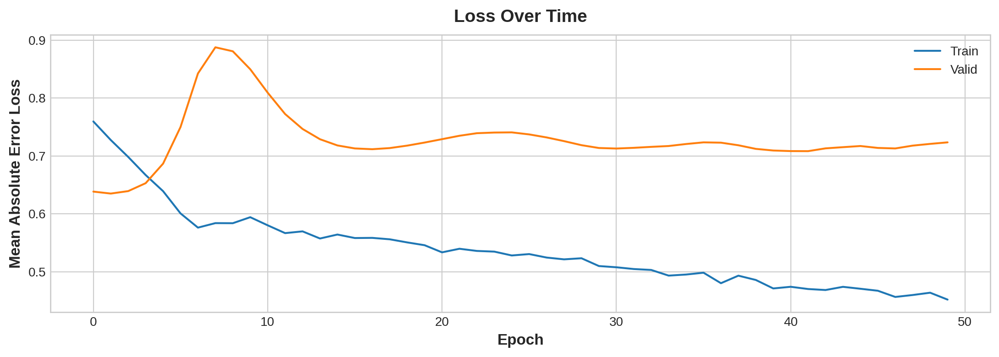

In [19]:
%%time
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-3,
    patience=2,
    verbose=0,)

if wave_model:
    del wave_model 
    
wave_model = get_model()

history = wave_model.fit(train_data, train_target,
                         #batch_size=batch_size,
                         epochs=50,
                         validation_split=0.4,
                         #callbacks = callback,
                         verbose=0,)  

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.xlabel('Epoch')
plt.ylabel('Mean Absolute Error Loss')
plt.title('Loss Over Time')
plt.legend(['Train','Valid'])

<font color="darkred">
<font size="4"> 
Actualy, the validation losses in earlier eras may be even smaller than in later ones. 
However, the models obtained at these stages are quite simple, and the corresponding forecasts are almost straight lines.
So here I use a fairly large number of epochs to give the model the ability to capture details of the data structure on a small data set.
</font>
</font>

In [20]:
#batch_size = 2**11

test_data = np.expand_dims(data_split.valid_X.values,axis=2)
test_target = np.expand_dims(data_split.valid_y.values,axis=2)

wave_model.evaluate(test_data, test_target)


1/1 [==============================] - 0s 37ms/step - loss: 0.5478


0.5478031635284424

In [21]:
test_result = wave_model.predict(test_data)[:,:,0]*data_split.valid_std.values.reshape(-1,1) + data_split.valid_mean.values.reshape(-1,1)
test_result = pd.DataFrame(test_result, index=data_split.df_valid_y.index, columns=data_split.df_valid_y.columns)

1/1 [==============================] - 1s 664ms/step


In [22]:
df_smape_results = pd.DataFrame(index=indx_10_pages)

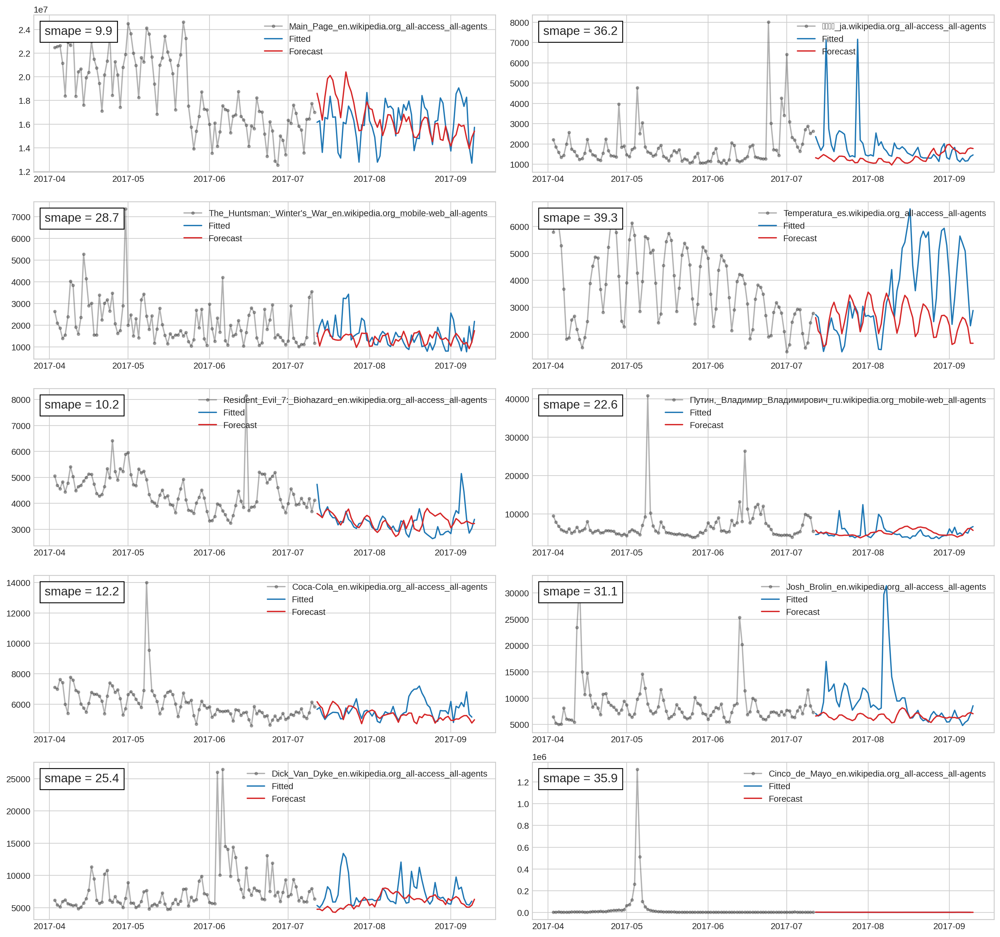

In [23]:
ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    
    #enc_data = np.expm1(data_split.df_valid_enc.loc[col,:])
    #target_data = np.expm1(data_split.df_valid_pred.loc[col,:])
    results_data = np.expm1(test_result.loc[col,:])
    
    #ax = enc_data[-100:].plot(ax = ax, color='0.25', alpha =0.4, style = '-',marker='.') #, title=f'{name}, n_fourier = {n_fourier}')
    #ax = target_data.plot(ax=ax, label = 'Fitted', color='C0')
    ax = data_split.plot_valid(col, ax, n_days=100)
    ax = results_data.plot(ax=ax, label = 'Forecast', color='C3')
    ax.legend(loc = 'upper right')
    
    smape_val = func_smape(data_split.df_valid_y.loc[col,:].fillna(0),results_data)
    df_smape_results.loc[col, 'common_model_no_lagged'] = smape_val
    
    if smape_val:
        at = AnchoredText(
            f"smape = {smape_val:.1f}",
            prop=dict(size=14),
            frameon=True,
            loc="upper left",
            #loc = kwargs['loc']
        )
        at.patch.set_boxstyle("square, pad=0.0")
        ax.add_artist(at)
    

In [ ]:
df_smape_results

,common_model_no_lagged
Main_Page_en.wikipedia.org_all-access_all-agents,9.879203
大塚芳忠_ja.wikipedia.org_all-access_all-agents,36.162531
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,28.663798
Temperatura_es.wikipedia.org_all-access_all-agents,39.342564
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,10.222616
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",22.552864
Coca-Cola_en.wikipedia.org_all-access_all-agents,12.188112
Josh_Brolin_en.wikipedia.org_all-access_all-agents,31.141646
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,25.422793
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,35.917874


## Autoregressive prediction style. Train with lagged data

In this case, actually the only one data point is predicted, 
and the desired forecast for 61 points is constructed iteratively by the autoregression approach.

In [25]:
def predict_sequence(input_data, model):
    
    history_data = input_data.copy()
    pred_data = np.zeros((input_data.shape[0],n_test_days,1)) # initialize output (pred_steps time steps)  
    
    for i in range(n_test_days):
        
        # record next time step prediction (last time step of model output) 
        last_step_pred = model.predict(history_data)[:,-1,0]
        pred_data[:,i,0] = last_step_pred
        
        # add the next time step prediction to the history sequence
        history_data = np.concatenate([history_data,last_step_pred.reshape(-1,1,1)], axis=1)

    return pred_data


In [26]:
#batch_size = 2**11

train_data = np.expand_dims(data_split.train_X.values, axis=2)
train_target = np.expand_dims(data_split.train_y.values, axis=2)

lagged_target = train_target[:,:-1,:1]
train_data = np.concatenate([train_data, lagged_target], axis=1)

CPU times: user 24.9 s, sys: 1.06 s, total: 25.9 s
Wall time: 12.2 s


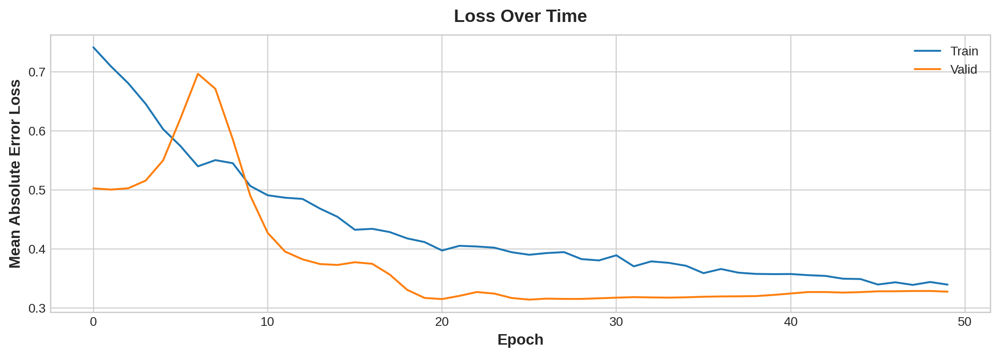

In [35]:
%%time
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-3,
    patience=2,
    verbose=0,)

if wave_model:
    del wave_model 
    
wave_model = get_model()

history = wave_model.fit(train_data, train_target,
                    #batch_size=batch_size,
                    epochs=50,
                    validation_split=0.2, 
                    #callbacks=callback,
                    verbose = 0)  

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.xlabel('Epoch')
plt.ylabel('Mean Absolute Error Loss')
plt.title('Loss Over Time')
plt.legend(['Train','Valid'])

In [36]:
#batch_size = 2**11

test_data = np.expand_dims(data_split.valid_X.values,axis=2)
test_target = np.expand_dims(data_split.valid_y.values,axis=2)

wave_model.evaluate(test_data, test_target)


1/1 [==============================] - 1s 1s/step - loss: 0.6926


0.6926155686378479

In [37]:
ar_result = predict_sequence(test_data, wave_model)[:,:,0]*data_split.valid_std.values.reshape(-1,1) + data_split.valid_mean.values.reshape(-1,1)
ar_result = pd.DataFrame(ar_result, index=data_split.df_valid_y.index, columns=data_split.df_valid_y.columns)

1/1 [==============================] - 0s 23ms/step


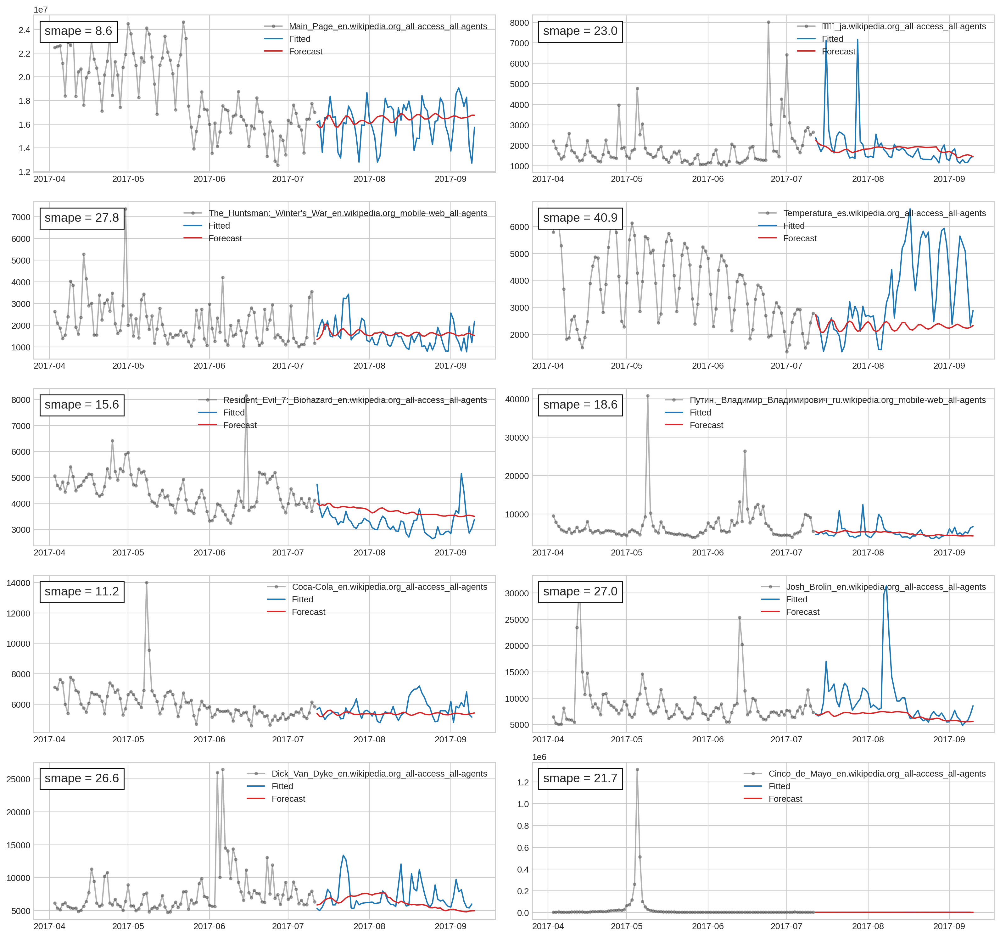

In [38]:
ncolstest_data = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    
    #enc_data = np.expm1(data_split.df_valid_enc.loc[col,:])
    #target_data = np.expm1(data_split.df_valid_pred.loc[col,:])
    results_data = np.expm1(ar_result.loc[col,:])
    
    #ax = enc_data[-100:].plot(ax = ax, color='0.25', alpha =0.4, style = '-',marker='.') #, title=f'{name}, n_fourier = {n_fourier}')
    #ax = target_data.plot(ax=ax, label = 'Fitted', color='C0')
    ax = data_split.plot_valid(col, ax, n_days=100)
    ax = results_data.plot(ax=ax, label = 'Forecast', color='C3')
    ax.legend(loc = 'upper right')
    
    smape_val = func_smape(data_split.df_valid_y.loc[col,:].fillna(0),results_data)
    df_smape_results.loc[col, 'ar_with_lagged'] = smape_val
    
    if smape_val:
        at = AnchoredText(
            f"smape = {smape_val:.1f}",
            prop=dict(size=14),
            frameon=True,
            loc="upper left",
            #loc = kwargs['loc']
        )
        at.patch.set_boxstyle("square, pad=0.0")
        ax.add_artist(at)
    

<font color="darkred">
    <font size="4"> 
The result obtained is quite general and does not reflect the fine details of the behavior of specific time series.
    </font>
</font>

In [39]:
df_smape_results

,common_model_no_lagged,ar_with_lagged
Main_Page_en.wikipedia.org_all-access_all-agents,9.879203,8.614747
大塚芳忠_ja.wikipedia.org_all-access_all-agents,36.162531,22.975281
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,28.663798,27.792629
Temperatura_es.wikipedia.org_all-access_all-agents,39.342564,40.947308
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,10.222616,15.616826
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",22.552864,18.550764
Coca-Cola_en.wikipedia.org_all-access_all-agents,12.188112,11.172644
Josh_Brolin_en.wikipedia.org_all-access_all-agents,31.141646,27.032215
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,25.422793,26.578018
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,35.917874,21.724450


-----------------------------------

# Separate model for each time series (page)

In this section, I try to build a separate model for each time series I consider.

In [60]:
'''
In this section the different splitting approach is used: 
the data are separating on the train, validation and test parts. 
The first two of them are used for training and the last one for final testing.

In the case of seq-to-seq forecasting approach, 
the actual training dataset for each time series is formed from the training part by randomly allocating sequences of length = n_input + n_labels in it, 
where the leading n_input points are used as input data, and the last n_labels points as labels.
The different allocations forms a batch of appropriate batch size. 
The training procedure takes place in several stages, in each of which one batch is processed.

In the case of autoregressive forecasting approach, 
the batches are generated by the same way except that the actual lentgh of the input data is n_input + n_label - 1. 
And the forecast is formed point by point.
'''

class dataFeeder:
    def __init__(self, ts, n_input, n_labels, log=True, norm=True):
        
        self.first_day = ts.notna().idxmax()
        self.ts = ts[self.first_day:].fillna(0)
        
        self.n_input = n_input
        self.n_labels = n_labels
        self.total_size = n_input + n_labels
        
        self.is_log = log
        self.is_norm = norm
        self.norm_input_only = False
        
        self.ts_train = self.ts[:-2*self.total_size]
        self.ts_valid = self.ts[-2*self.total_size : -self.total_size]
        self.ts_test  = self.ts[-self.total_size:]
        
        while self.ts_train.size < self.total_size: 
            self.n_input -= 10
            self.total_size = self.n_input + n_labels
            self.ts_train = self.ts[:-2*self.total_size]
            self.ts_valid = self.ts[-2*self.total_size : -self.total_size]
            self.ts_test  = self.ts[-self.total_size:]
            
            if self.n_input < 10:
                raise ValueError(f'Dataset size = {self.ts.size}, is too small: it is not consistent with label number {self.n_labels} and'
                                 f'it leaves only {self.n_input} datapoints for training!')      
                
        if self.is_log: 
            self.log_test  = np.log1p(self.ts_test)
            self.log_valid = np.log1p(self.ts_valid)
            self.log_train  = np.log1p(self.ts_train)
        else:
            self.log_test  = self.ts_test
            self.log_valid = self.ts_valid
            self.log_train  = self.ts_train
            
        if self.is_norm:
            self.train_mean = self.log_train.mean()
            self.train_std = self.log_train.std()
        else:
            self.train_mean = 1
            self.train_std = 0
            
        if self.norm_input_only:             
            self.train_mean = self.log_test[:-self.n_labels].mean()
            self.train_std = self.log_test[:-self.n_labels].std()
        else:
            self.log_test  = (self.log_test - self.train_mean)/self.train_std
            self.log_valid = (self.log_valid - self.train_mean)/self.train_std
            self.log_train  = (self.log_train - self.train_mean)/self.train_std
        
        self.smape = None
        self.n_batch = None
        self.n_stride = None
        
    def __repr__(self):
        return '\n'.join([
        '\n--- Attributes: ---\n',
        f'n_input = {self.n_input} -- size of train data',
        f'n_labels = {self.n_labels} - number of days to predict (size of label set)',
        f'ts_train - original TS for training. Shape is {self.ts_train.shape}',
        f'ts_valid - original TS for validation. Shape is {self.ts_valid.shape}',
        f'ts_test - original TS for testing. Shape is {self.ts_test.shape}',        
        f'test_mean = {self.test_mean}',
        f'test_std = {self.test_std} \n',
        '--- Notes: --- \n',
        f'Size of train (input) part is {self.ts_train[:-self.n_labels].size}',
        f'train_size - n_input = {self.ts_train[:-self.n_labels].size - self.n_input}',
        f'self.n_stride = {self.n_stride}',
        f'self.n_batch = {self.n_batch}',
        f'self.smape = {self.smape}',
        '----------------------------------------------------------------- \n',])
        
        
    def split_dataset(self, data):                 
        train      = data[:, :-self.n_labels, :]
        
        if self.norm_input_only:
            input_mean = tf.math.reduce_mean(train, 1, keepdims=True)
            input_std  = tf.math.reduce_std(train, 1, keepdims=True)
        else: 
            input_mean = 0
            input_std = 1
    
        train = (train - input_mean)/input_std    
    
        labels = (data[:, -self.n_labels:, :]  - input_mean)/input_std
        
        train.set_shape([None, self.n_input, None])
        labels.set_shape([None, self.n_labels, None])
            
        return train, labels
    
    def split_dataset_lag(self, data):         
        train      = data[:, :-1, :] 
        
        if self.norm_input_only:
            input_mean = tf.math.reduce_mean(train, 1, keepdims=True)
            input_std  = tf.math.reduce_std(train, 1, keepdims=True)
        else:
            input_mean = 0
            input_std = 1
    
        train = (train - input_mean)/input_std    
    
        labels = (data[:, -self.n_labels:, :]  - input_mean)/input_std
        
        train.set_shape([None, self.total_size-1, None])
        labels.set_shape([None, self.n_labels, None])
            
        return train, labels
        
    def make_dataset(self, data, n_batch, n_stride=1, mode=None):
        self.n_batch = n_batch
        self.n_stride = n_stride
        ds = tf.keras.utils.timeseries_dataset_from_array(
            data=data.values.reshape(-1,1),
            targets=None,
            sequence_length=self.total_size,
            sequence_stride=n_stride,
            shuffle=True,
            batch_size=n_batch,)
            
        if mode == 'lag':
            ds = ds.map(self.split_dataset_lag)
        else:
            ds = ds.map(self.split_dataset)
            
        return ds
    
    def plot_test(self, ax=None, model=None, pred_seq=False):
        
        if ax is None:
            fig, ax = plt.subplots()
            
        ax = self.ts_test[:-self.n_labels].plot(ax = ax, color='0.25', alpha =0.4, style = '-',marker='.') #, title=f'{name}, n_fourier = {n_fourier}')
        ax = self.ts_test[-self.n_labels:].plot(ax=ax, label = 'Fitted', color='C0')
        
        if model: 
            if pred_seq:
                prediction = np.expm1(self.pred_seq(model) * self.train_std + self.train_mean)
            else:
                train, true = next(iter(self.test))
                prediction = np.expm1(model(train) * self.train_std + self.train_mean).flatten()
            
            ts_pred = pd.Series(prediction, index=self.ts_test[-self.n_labels:].index)                       
            ax = ts_pred.plot(ax=ax, label = 'Forecast', color='C3')
            
            self.smape = func_smape(self.ts_test[-self.n_labels:].values,prediction)
            
        ax.legend(loc = 'upper right')  
        
        if self.smape:
            at = AnchoredText(
                f"smape = {self.smape:.1f}",
                prop=dict(size=14),
                frameon=True,
                loc="upper left",
                #loc = kwargs['loc']
            )
            at.patch.set_boxstyle("square, pad=0.0")
            ax.add_artist(at)      
        
        return ax
    
    def pred_seq(self, model):
        train, true = next(iter(self.test))
        result = np.zeros(self.n_labels)
        for i in range(self.n_labels):
            pred = model(train).numpy()[:,-1:,:]
            train = tf.concat([train,pred],axis=1)
            result[i] = pred.flatten()
        return result
        
    @property
    def train(self):
        return self.make_dataset(self.log_train, 32)
    
    @property
    def train_lag(self):
        return self.make_dataset(self.log_train, 32, mode='lag')

    @property
    def val(self):
        return self.make_dataset(self.log_valid, 1)

    @property
    def test(self):
        return self.make_dataset(self.log_test, 1)        

## Seq_to_set prediction (no lagged data)

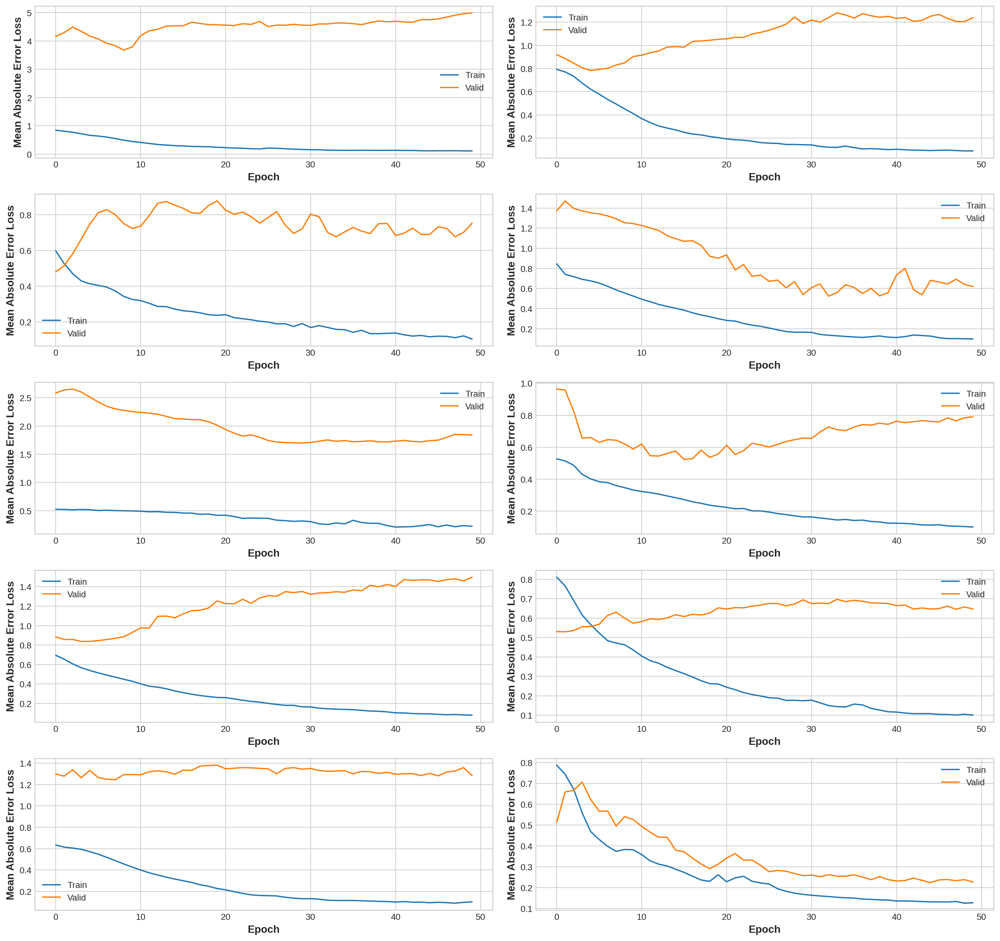

In [68]:
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-3,
    patience=10,
    verbose=1)

data_feed = {}
models = {}

ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

n_train = 150

wave_model = None

for ax, col in zip(fig.get_axes(), indx_10_pages):
   
    data_feed[col] = dataFeeder(df_train.loc[col,:], n_train, n_test_days, norm=True)    
    
    if wave_model: 
        del wave_model
    wave_model = get_model()
    
    history = wave_model.fit(data_feed[col].train, 
                            epochs=50, 
                            validation_data=data_feed[col].val, 
                            #callbacks=callback,
                            verbose=0,)
    
    models[col] = wave_model
    
    ax.plot(history.history['loss'],)
    ax.plot(history.history['val_loss'],)

    ax.set_xlabel('Epoch')
    ax.set_ylabel('Mean Absolute Error Loss')
    ax.legend(['Train','Valid'])    

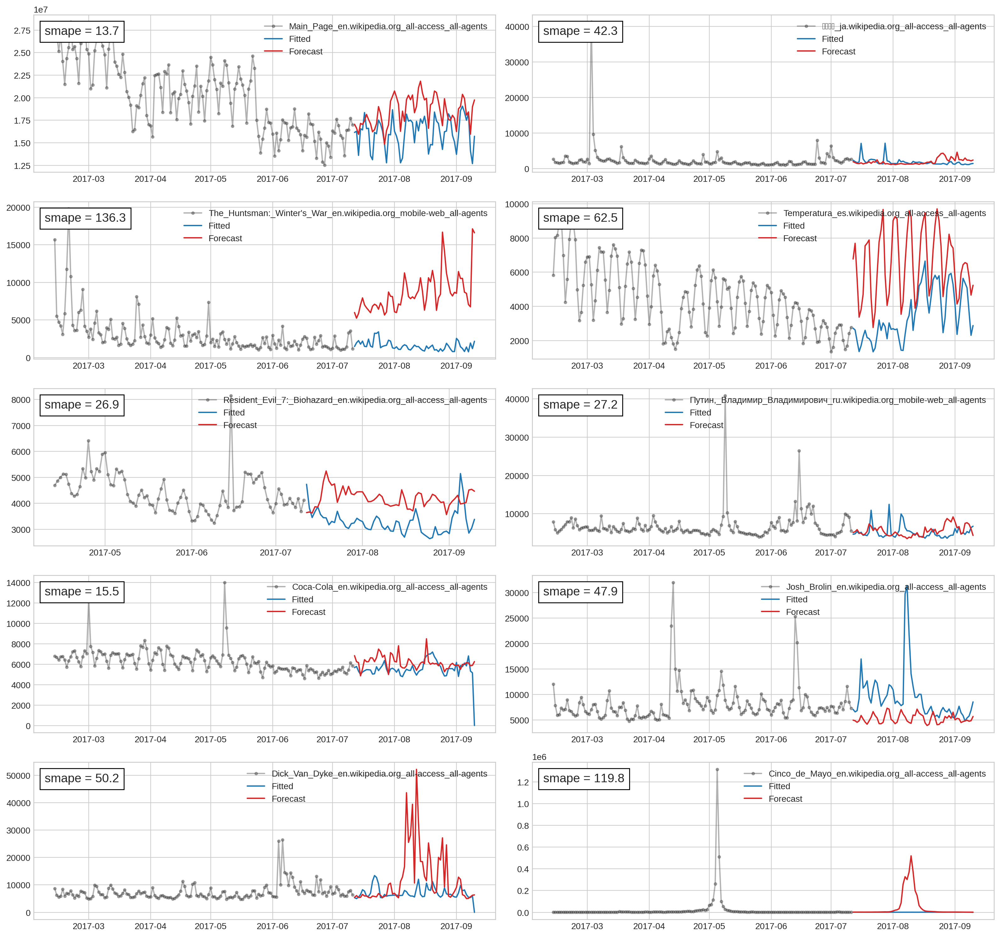

In [69]:
fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    data_feed[col].plot_test(ax = ax, model=models[col])
    df_smape_results.loc[col,'each_ts_model_no_lagged'] = data_feed[col].smape

In [70]:
df_smape_results

,common_model_no_lagged,ar_with_lagged,each_ts_model_no_lagged
Main_Page_en.wikipedia.org_all-access_all-agents,9.879203,8.614747,13.720825
大塚芳忠_ja.wikipedia.org_all-access_all-agents,36.162531,22.975281,42.279229
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,28.663798,27.792629,136.346535
Temperatura_es.wikipedia.org_all-access_all-agents,39.342564,40.947308,62.497979
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,10.222616,15.616826,26.935417
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",22.552864,18.550764,27.247059
Coca-Cola_en.wikipedia.org_all-access_all-agents,12.188112,11.172644,15.516180
Josh_Brolin_en.wikipedia.org_all-access_all-agents,31.141646,27.032215,47.867085
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,25.422793,26.578018,50.230021
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,35.917874,21.724450,119.790468


----------------

## AR prediction style and training with lagged data

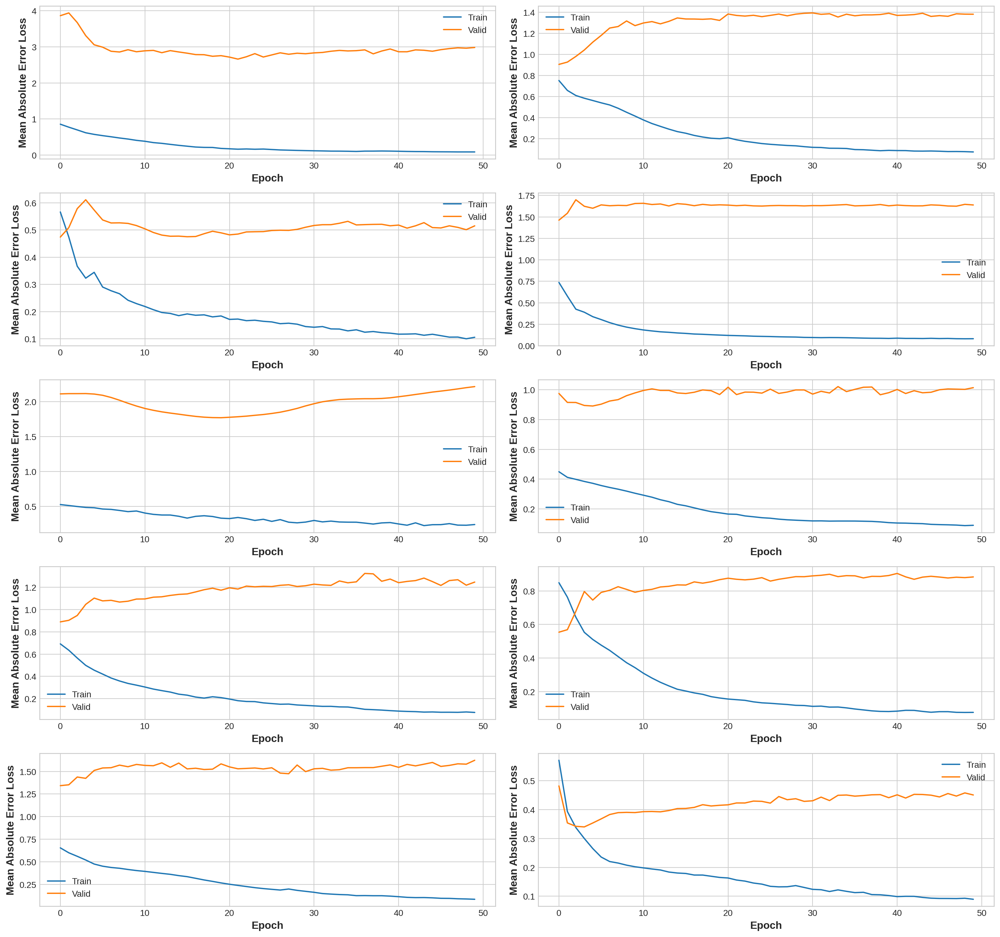

In [71]:
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-3,
    patience=2,
    verbose=1)

data_feed = {}
models = {}

ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

n_train = 150

wave_model = None

for ax, col in zip(fig.get_axes(), indx_10_pages):
   
    data_feed[col] = dataFeeder(df_train.loc[col,:], n_train, n_test_days, norm=True)    
    
    if wave_model: 
        del wave_model
    wave_model = get_model()
    
    history = wave_model.fit(data_feed[col].train_lag, 
                            epochs=50, 
                            validation_data=data_feed[col].val, 
                            #callbacks=callback,
                            verbose=0,)
    
    models[col] = wave_model
    
    ax.plot(history.history['loss'],)
    ax.plot(history.history['val_loss'],)

    ax.set_xlabel('Epoch')
    ax.set_ylabel('Mean Absolute Error Loss')
    ax.legend(['Train','Valid'])    

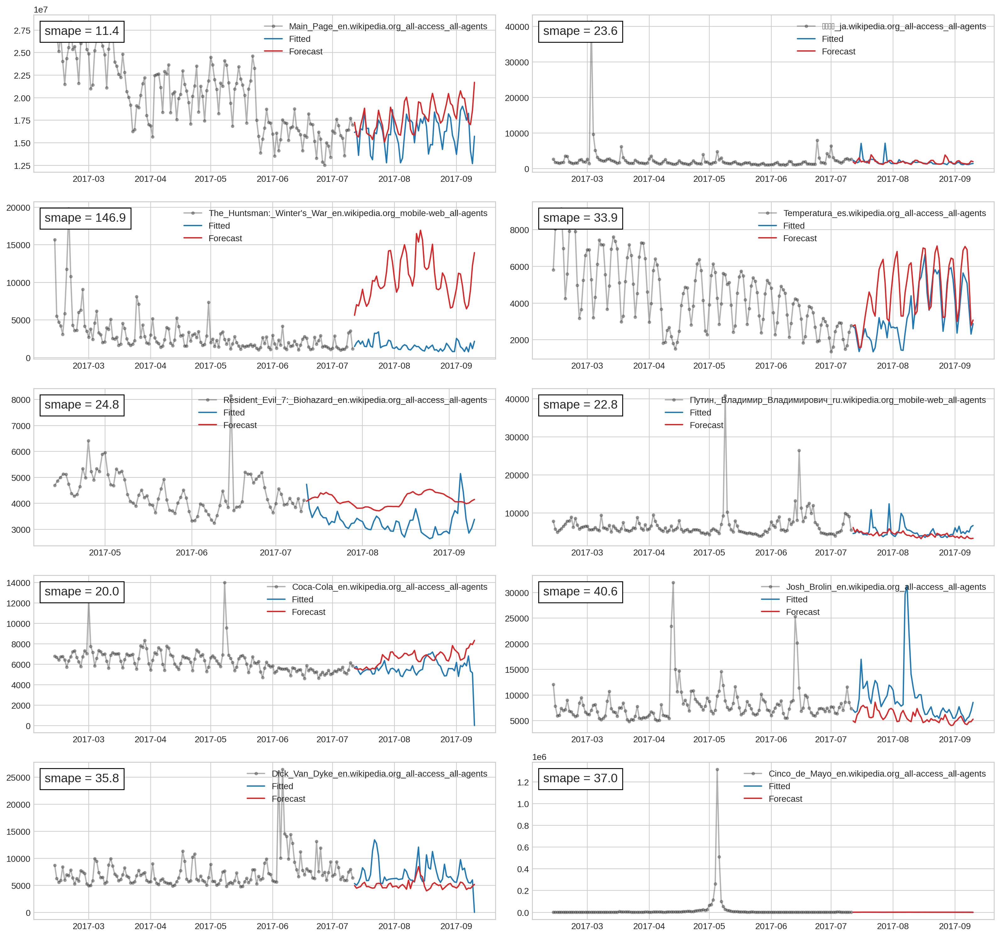

In [72]:
fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    data_feed[col].plot_test(ax = ax, model=models[col],pred_seq=True)
    df_smape_results.loc[col,'each_ts_model_ar_with_lagged'] = data_feed[col].smape

In [73]:
df_smape_results

,common_model_no_lagged,ar_with_lagged,each_ts_model_no_lagged,each_ts_model_ar_with_lagged
Main_Page_en.wikipedia.org_all-access_all-agents,9.879203,8.614747,13.720825,11.382184
大塚芳忠_ja.wikipedia.org_all-access_all-agents,36.162531,22.975281,42.279229,23.575107
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,28.663798,27.792629,136.346535,146.881046
Temperatura_es.wikipedia.org_all-access_all-agents,39.342564,40.947308,62.497979,33.873550
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,10.222616,15.616826,26.935417,24.805932
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",22.552864,18.550764,27.247059,22.771213
Coca-Cola_en.wikipedia.org_all-access_all-agents,12.188112,11.172644,15.516180,19.978204
Josh_Brolin_en.wikipedia.org_all-access_all-agents,31.141646,27.032215,47.867085,40.626059
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,25.422793,26.578018,50.230021,35.793435
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,35.917874,21.724450,119.790468,37.015414


---------------------

# Separate models but with different train-val-test allocation

Given only one time series for training, validation and test, it is too difficult to get anouhg data for training to rich the good performace.\
To expand the data set available for the training procedure, 
the current section uses a splitting approach where only the last 61 points are hidden for final testing 
and the remaining data is used for training and validation.\
Batch allocation is performed in the same way as in the previous section, 
except more input data (larger n_input value) can be used now.

In [94]:
class dataFeeder_v2:
    def __init__(self, ts, n_input, n_labels, log=True, norm=True):
        
        self.first_day = ts.notna().idxmax()
        self.ts = ts[self.first_day:].fillna(0)
        
        self.n_input = n_input
        self.n_labels = n_labels
        self.total_size = n_input + n_labels
        
        self.is_log = log
        self.is_norm = norm
        self.norm_input_only = False
        
        self.ts_train = self.ts[: -self.n_labels]
        self.ts_valid = self.ts[: -self.n_labels]
        self.ts_test  = self.ts[-self.total_size:]
        
        while self.ts_train.size < self.total_size: 
            self.n_input -= 10
            self.total_size = self.n_input + n_labels
            self.ts_train = self.ts[:-2*self.total_size]
            self.ts_valid = self.ts[-2*self.total_size : -self.total_size]
            self.ts_test  = self.ts[-self.total_size:]
            
            if self.n_input < 10:
                raise ValueError(f'Dataset size = {self.ts.size}, is too small: it is not consistent with label number {self.n_labels} and'
                                 f'it leaves only {self.n_input} datapoints for training!')      
                
        if self.is_log: 
            self.log_test  = np.log1p(self.ts_test)
            self.log_valid = np.log1p(self.ts_valid)
            self.log_train  = np.log1p(self.ts_train)
        else:
            self.log_test  = self.ts_test
            self.log_valid = self.ts_valid
            self.log_train  = self.ts_train
            
        if self.is_norm:
            self.train_mean = self.log_train.mean()
            self.train_std = self.log_train.std()
        else:
            self.train_mean = 1
            self.train_std = 0
            
        if self.norm_input_only:             
            self.train_mean = self.log_test[:-self.n_labels].mean()
            self.train_std = self.log_test[:-self.n_labels].std()
        else:
            self.log_test  = (self.log_test - self.train_mean)/self.train_std
            self.log_valid = (self.log_valid - self.train_mean)/self.train_std
            self.log_train  = (self.log_train - self.train_mean)/self.train_std
        
        self.smape = None
        self.n_batch = None
        self.n_stride = None
        
    def __repr__(self):
        return '\n'.join([
        '\n--- Attributes: ---\n',
        f'n_input = {self.n_input} -- size of train data',
        f'n_labels = {self.n_labels} - number of days to predict (size of label set)',
        f'ts_train - original TS for training. Shape is {self.ts_train.shape}',
        f'ts_valid - original TS for validation. Shape is {self.ts_valid.shape}',
        f'ts_test - original TS for testing. Shape is {self.ts_test.shape}',        
        f'test_mean = {self.test_mean}',
        f'test_std = {self.test_std} \n',
        '--- Notes: --- \n',
        f'Size of train (input) part is {self.ts_train[:-self.n_labels].size}',
        f'train_size - n_input = {self.ts_train[:-self.n_labels].size - self.n_input}',
        f'self.n_stride = {self.n_stride}',
        f'self.n_batch = {self.n_batch}',
        f'self.smape = {self.smape}',
        '----------------------------------------------------------------- \n',])
        
        
    def split_dataset(self, data):                 
        train = data[:, :-self.n_labels, :]
        
        if self.norm_input_only:
            input_mean = tf.math.reduce_mean(train, 1, keepdims=True)
            input_std  = tf.math.reduce_std(train, 1, keepdims=True)
        else: 
            input_mean = 0
            input_std = 1
    
        train = (train - input_mean)/input_std    
    
        labels = (data[:, -self.n_labels:, :]  - input_mean)/input_std
        
        train.set_shape([None, self.n_input, None])
        labels.set_shape([None, self.n_labels, None])
            
        return train, labels
    
    def split_dataset_lag(self, data):         
        train = data[:, :-1, :] 
        
        if self.norm_input_only:
            input_mean = tf.math.reduce_mean(train, 1, keepdims=True)
            input_std  = tf.math.reduce_std(train, 1, keepdims=True)
        else:
            input_mean = 0
            input_std = 1
    
        train = (train - input_mean)/input_std    
    
        labels = (data[:, -self.n_labels:, :]  - input_mean)/input_std
        
        train.set_shape([None, self.total_size-1, None])
        labels.set_shape([None, self.n_labels, None])
            
        return train, labels
        
    def make_dataset(self, data, n_batch, n_stride=1, mode=None):
        self.n_batch = n_batch
        self.n_stride = n_stride
        ds = tf.keras.utils.timeseries_dataset_from_array(
            data=data.values.reshape(-1,1),
            targets=None,
            sequence_length=self.total_size,
            sequence_stride=n_stride,
            shuffle=True,
            batch_size=n_batch,)
            
        if mode == 'lag':
            ds = ds.map(self.split_dataset_lag)
        else:
            ds = ds.map(self.split_dataset)
            
        return ds
    
    def plot_test(self, ax=None, model=None, pred_seq=False):
        
        if ax is None:
            fig, ax = plt.subplots()
            
        ax = self.ts_test[:-self.n_labels].plot(ax = ax, color='0.25', alpha =0.4, style = '-',marker='.') #, title=f'{name}, n_fourier = {n_fourier}')
        ax = self.ts_test[-self.n_labels:].plot(ax=ax, label = 'Fitted', color='C0')
        
        if model: 
            if pred_seq:
                prediction = np.expm1(self.pred_seq(model) * self.train_std + self.train_mean)
            else:
                train, true = next(iter(self.test))
                prediction = np.expm1(model(train) * self.train_std + self.train_mean).flatten()
            
            ts_pred = pd.Series(prediction, index=self.ts_test[-self.n_labels:].index)                       
            ax = ts_pred.plot(ax=ax, label = 'Forecast', color='C3')
            
            self.smape = func_smape(self.ts_test[-self.n_labels:].values,prediction)
            
        ax.legend(loc = 'upper right')  
        
        if self.smape:
            at = AnchoredText(
                f"smape = {self.smape:.1f}",
                prop=dict(size=14),
                frameon=True,
                loc="upper left",
                #loc = kwargs['loc']
            )
            at.patch.set_boxstyle("square, pad=0.0")
            ax.add_artist(at)      
        
        return ax
    
    def pred_seq(self, model):
        train, true = next(iter(self.test))
        result = np.zeros(self.n_labels)
        for i in range(self.n_labels):
            pred = model(train).numpy()[:,-1:,:]
            train = tf.concat([train,pred],axis=1)
            result[i] = pred.flatten()
        return result
        
    @property
    def train(self):
        return self.make_dataset(self.log_train, 32)
    
    @property
    def train_lag(self):
        return self.make_dataset(self.log_train, 32, mode='lag')

    @property
    def val(self):
        return self.make_dataset(self.log_valid, 32)

    @property
    def test(self):
        return self.make_dataset(self.log_test, 1)        

## Seq-to-seq prediction

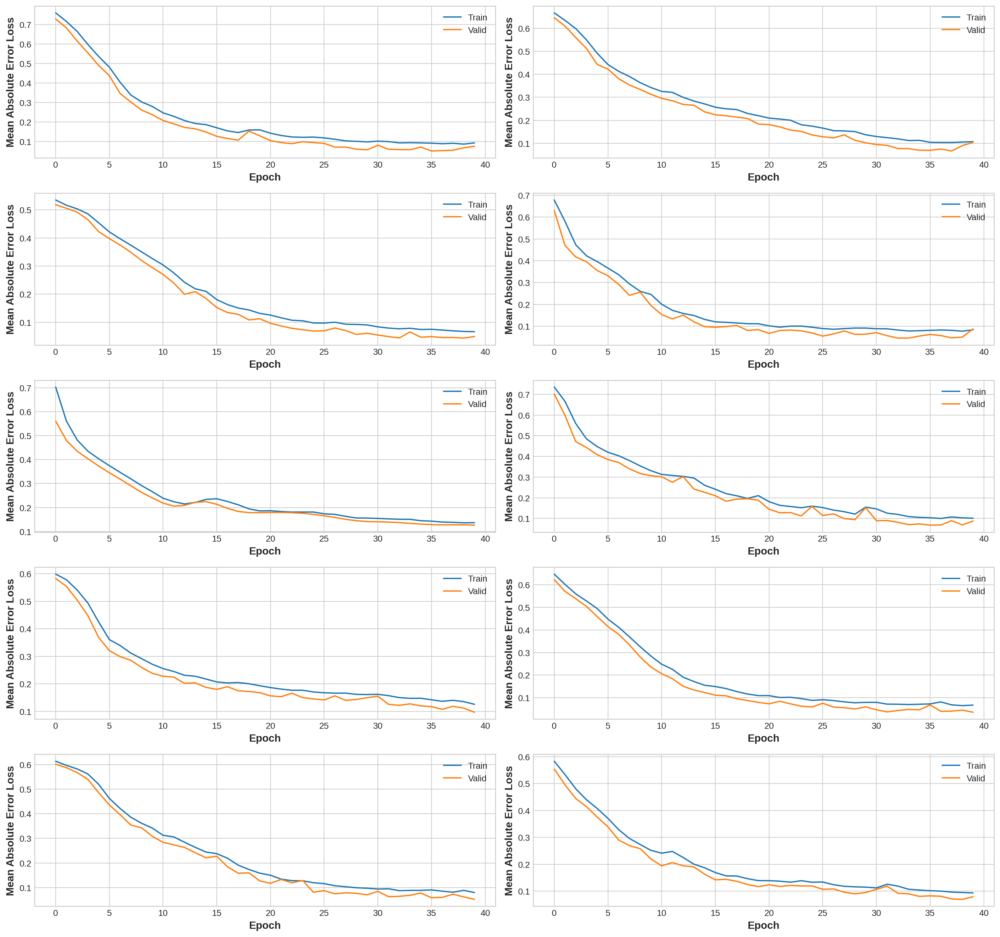

In [125]:
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-3,
    patience=10,
    verbose=1)

data_feed = {}
models = {}

ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

n_train = 300

wave_model = None

for ax, col in zip(fig.get_axes(), indx_10_pages):
   
    data_feed[col] = dataFeeder_v2(df_train.loc[col,:], n_train, n_test_days, norm=True)    
    
    if wave_model: 
        del wave_model
    wave_model = get_model()
    
    history = wave_model.fit(data_feed[col].train, 
                            epochs=40, 
                            validation_data=data_feed[col].val, 
                            #callbacks=callback,
                            verbose=0,)
    
    models[col] = wave_model
    
    ax.plot(history.history['loss'],)
    ax.plot(history.history['val_loss'],)

    ax.set_xlabel('Epoch')
    ax.set_ylabel('Mean Absolute Error Loss')
    ax.legend(['Train','Valid'])    

<font color="darkred">
    <font size="4">         
        Since the validation data spans the same data set as the training data, the validation loss in this case is not very informative. 
        Therefore a sufficient number of epochs is used to obtain a sufficiently complex model that allows one to capture the features of each specific time series.
    </font>
</font>

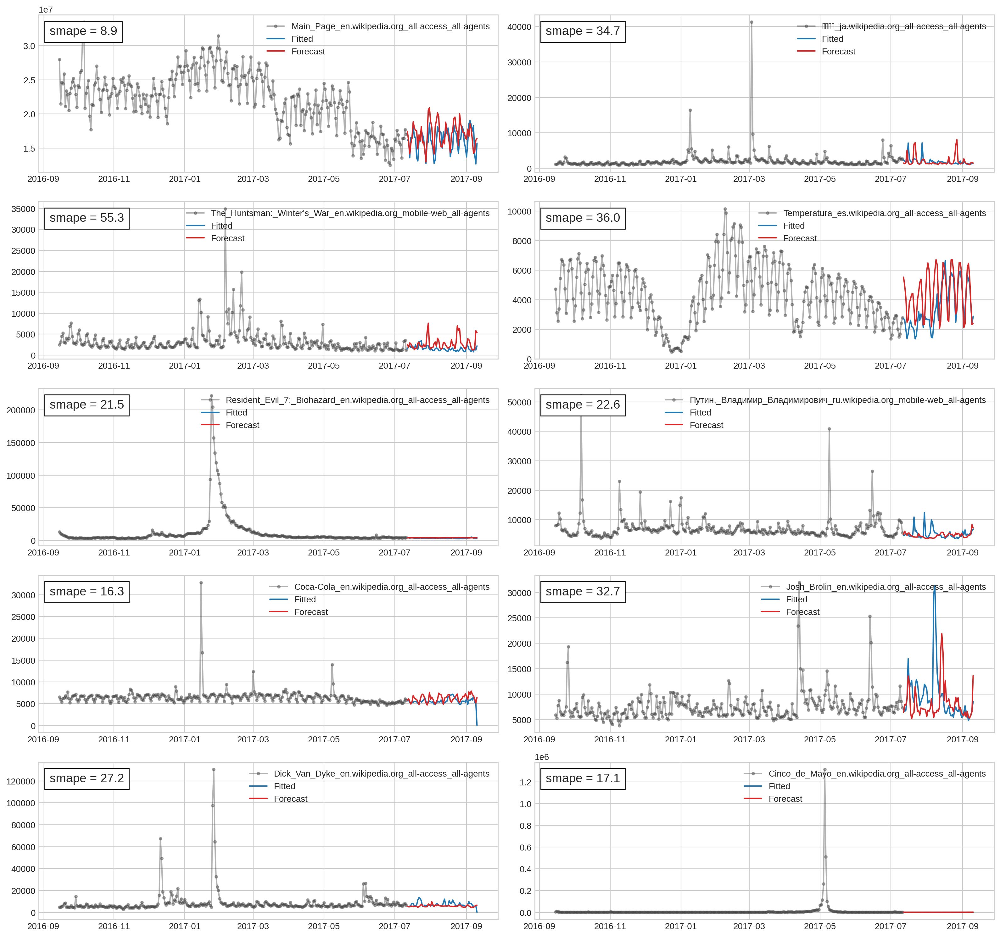

In [126]:
fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    data_feed[col].plot_test(ax = ax, model=models[col],pred_seq=False)
    df_smape_results.loc[col,'diff_allocation_no_lagged'] = data_feed[col].smape

## AR prediction (with lagged data) 

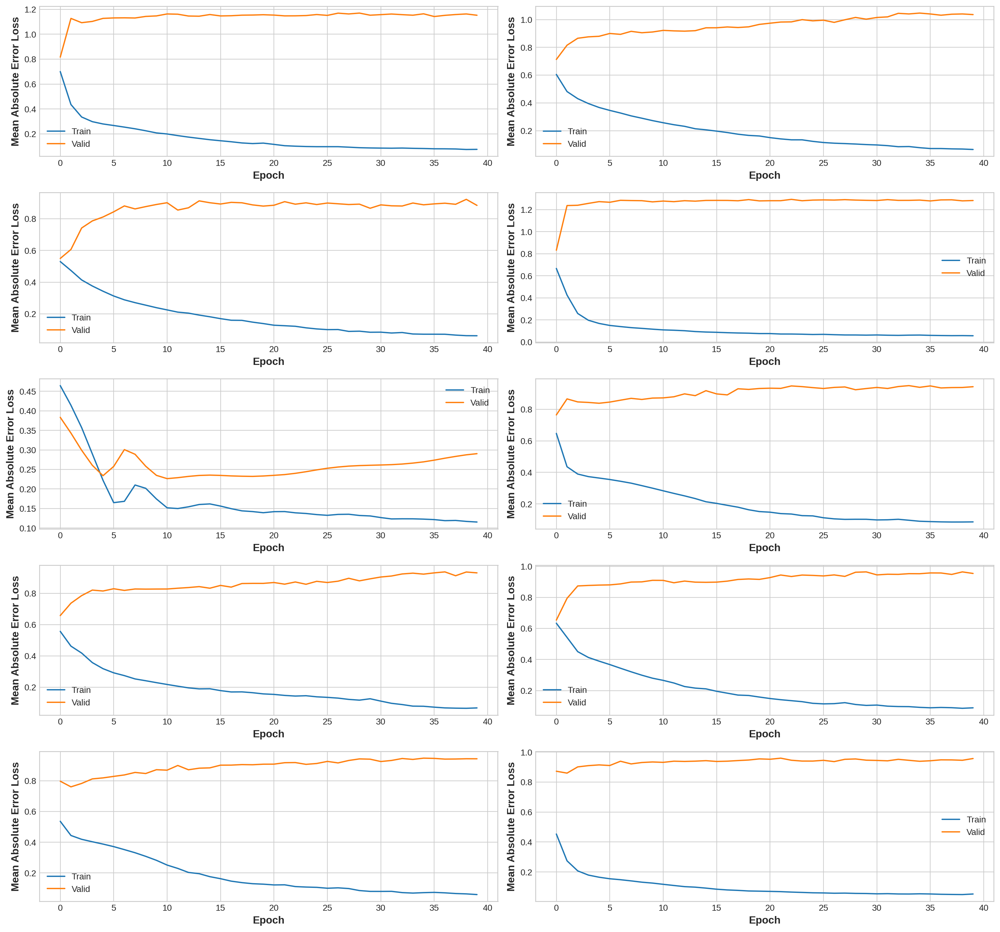

In [128]:
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-3,
    patience=10,
    verbose=1)

data_feed = {}
models = {}

ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

n_train = 300

wave_model = None

for ax, col in zip(fig.get_axes(), indx_10_pages):
   
    data_feed[col] = dataFeeder_v2(df_train.loc[col,:], n_train, n_test_days, norm=True)    
    
    if wave_model: 
        del wave_model
    wave_model = get_model()
    
    history = wave_model.fit(data_feed[col].train_lag, 
                            epochs=40, 
                            validation_data=data_feed[col].val, 
                            #callbacks=callback,
                            verbose=0,)
    
    models[col] = wave_model
    
    ax.plot(history.history['loss'],)
    ax.plot(history.history['val_loss'],)

    ax.set_xlabel('Epoch')
    ax.set_ylabel('Mean Absolute Error Loss')
    ax.legend(['Train','Valid'])    

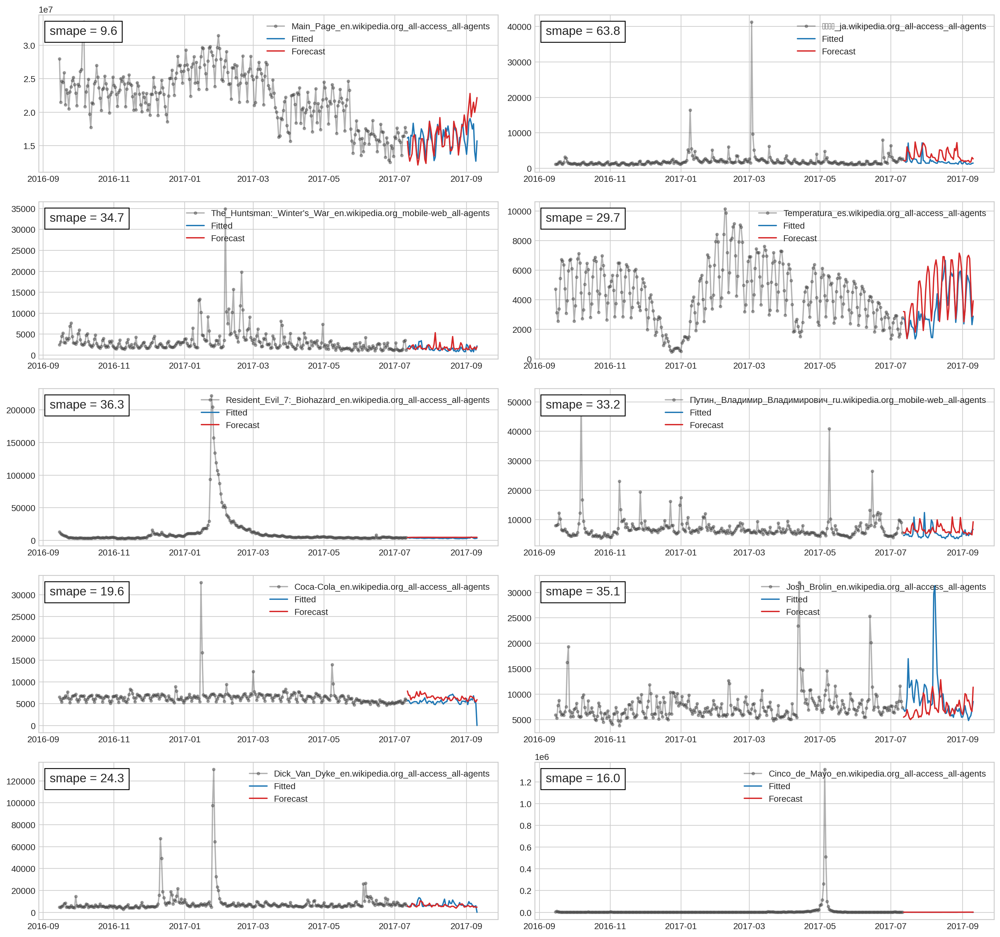

In [131]:
fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    data_feed[col].plot_test(ax = ax, model=models[col],pred_seq=True)
    df_smape_results.loc[col,'diff_allocation_ar_with_lagged'] = data_feed[col].smape

# Review of the results obtained

In [132]:
df_smape_results

,common_model_no_lagged,ar_with_lagged,each_ts_model_no_lagged,each_ts_model_ar_with_lagged,diff_allocation_no_lagged,diff_allocation_ar_with_lagged
Main_Page_en.wikipedia.org_all-access_all-agents,9.879203,8.614747,13.720825,11.382184,8.885032,9.560464
大塚芳忠_ja.wikipedia.org_all-access_all-agents,36.162531,22.975281,42.279229,23.575107,34.733844,63.803699
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,28.663798,27.792629,136.346535,146.881046,55.258018,34.722114
Temperatura_es.wikipedia.org_all-access_all-agents,39.342564,40.947308,62.497979,33.873550,35.971510,29.708083
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,10.222616,15.616826,26.935417,24.805932,21.520011,36.327298
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",22.552864,18.550764,27.247059,22.771213,22.564002,33.213112
Coca-Cola_en.wikipedia.org_all-access_all-agents,12.188112,11.172644,15.516180,19.978204,16.334826,19.584798
Josh_Brolin_en.wikipedia.org_all-access_all-agents,31.141646,27.032215,47.867085,40.626059,32.674907,35.124982
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,25.422793,26.578018,50.230021,35.793435,27.170728,24.348910
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,35.917874,21.724450,119.790468,37.015414,17.110858,15.978223


<font color="darkred">
    <font size="4">         
        Unfortunately, based on the smap values obtained on the test set, 
        it is impossible to confidently give preference to any specific approach 
        to forming and training the WaveNet model considered in this work. 
        However, the models obtained in the last part best reproduce 
        the individual characteristics of each specific time series, 
        which can be assessed visually on the plots presented.
    </font>
</font>